In [3]:
!pip install labelme tensorflow matplotlib opencv-python albumentations

In [4]:
import os
import time
import uuid
import cv2

In [5]:
IMAGES_PATH = os.path.join('data','images')
number_images = 30

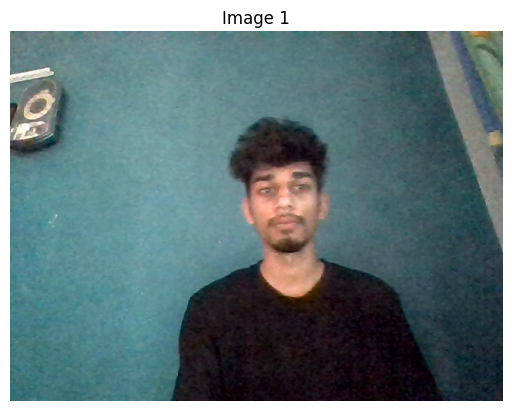

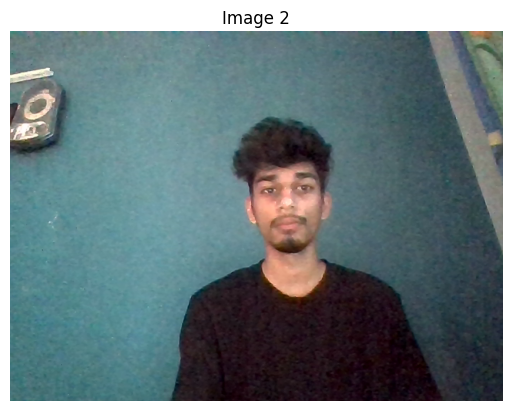

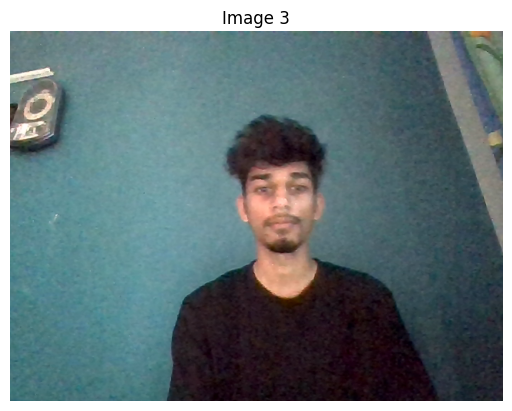

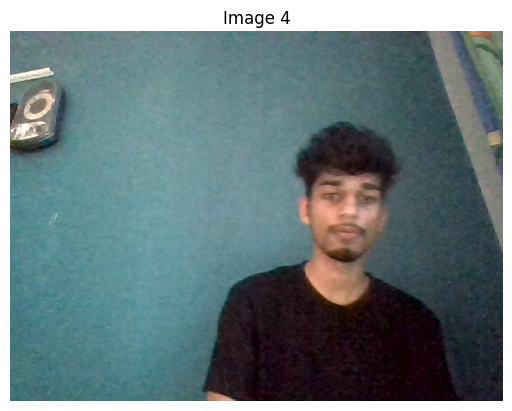

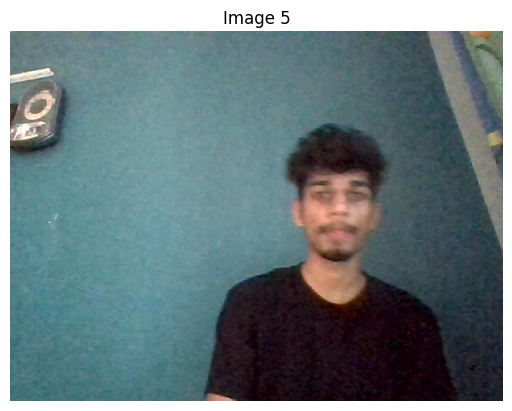

...

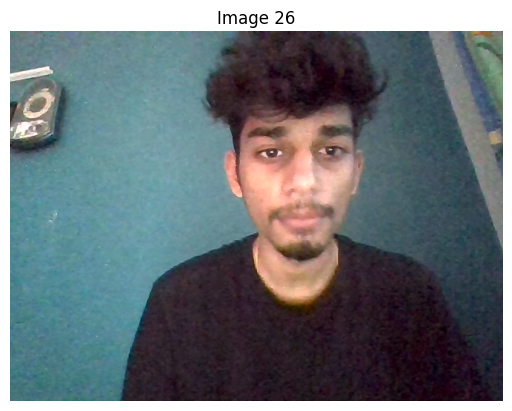

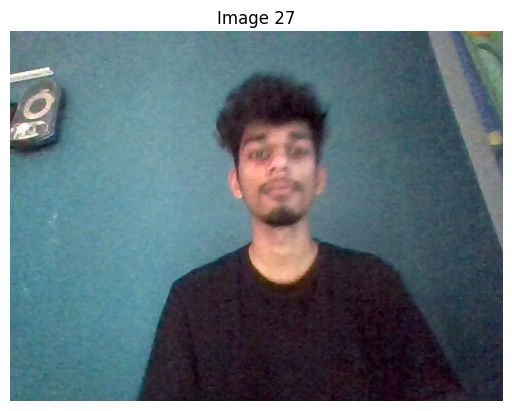

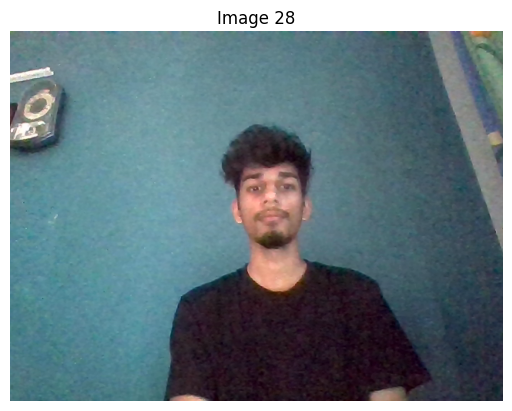

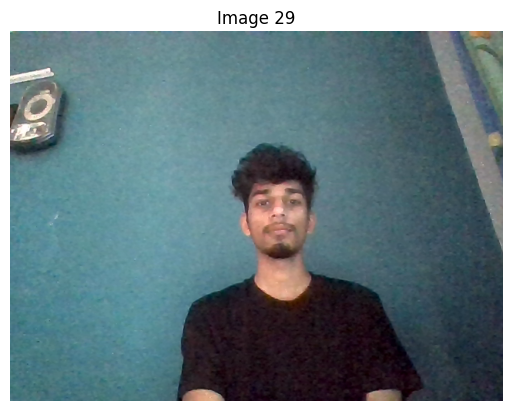

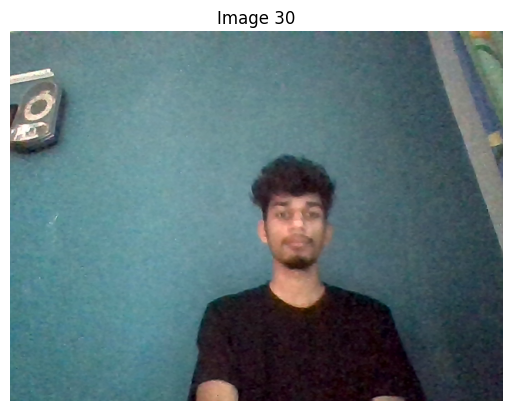

In [7]:
import matplotlib.pyplot as plt


cap = cv2.VideoCapture(0)

for imgnum in range(number_images):
    print(f'Collecting image {imgnum + 1}/{number_images}')
    ret, frame = cap.read()

    if not ret:
        print("Failed to capture image")
        break

    # Save image with unique name
    imgname = os.path.join(IMAGES_PATH, f'{str(uuid.uuid1())}.jpg')
    cv2.imwrite(imgname, frame)

    # Convert BGR (OpenCV) to RGB (matplotlib) and display
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.title(f'Image {imgnum + 1}')
    plt.axis('off')
    plt.show()

    # Delay between captures
    time.sleep(0.5)

# Release the camera
cap.release()

In [8]:
!labelme

2025-07-16 13:40:34.234 | INFO     | labelme.config:get_config:66 - Loading config file from: C:\Users\visha\.labelmerc
2025-07-16 13:40:35.150 | DEBUG    | labelme.widgets.canvas:set_ai_model_name:140 - Setting AI model to 'sam2:latest'


In [9]:
import tensorflow as tf
import json
import numpy as np

In [10]:
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [11]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [12]:
images = tf.data.Dataset.list_files('data\\images\\*.jpg')

In [13]:
images.as_numpy_iterator().next()

b'data\\images\\4b763b29-621c-11f0-b743-50c2e84a8cd2.jpg'

In [14]:
def load_image(x):
    byte_img = tf.io.read_file(x)
    img = tf.io.decode_jpeg(byte_img)
    return img

In [15]:
images = images.map(load_image)

In [16]:
images.as_numpy_iterator().next()

array([[[148, 152, 151],
        [144, 148, 149],
        [139, 140, 144],
        ...,
        [117, 116, 114],
        [109, 107, 110],
        [104, 102, 105]],

       [[139, 145, 143],
        [136, 142, 142],
        [134, 137, 142],
        ...,
        [116, 116, 114],
        [112, 110, 111],
        [107, 107, 109]],

       [[124, 134, 133],
        [124, 134, 133],
        [126, 134, 137],
        ...,
        [116, 118, 115],
        [113, 113, 113],
        [109, 111, 110]],

       ...,

       [[ 53, 101, 103],
        [ 53, 101, 103],
        [ 54, 104, 105],
        ...,
        [ 37,  29,  42],
        [ 35,  29,  41],
        [ 34,  28,  40]],

       [[ 53, 101, 103],
        [ 56, 104, 106],
        [ 59, 107, 109],
        ...,
        [ 33,  25,  38],
        [ 33,  27,  39],
        [ 35,  29,  41]],

       [[ 53, 101, 103],
        [ 58, 106, 108],
        [ 63, 111, 113],
        ...,
        [ 21,  13,  26],
        [ 22,  16,  28],
        [ 27,  21,  33]]

In [17]:
image_generator = images.batch(4).as_numpy_iterator()

In [18]:
plot_images = image_generator.next()

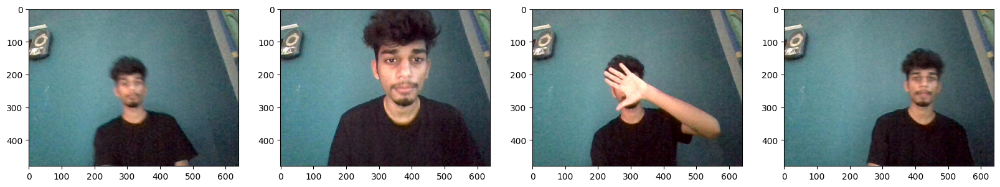

In [19]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, image in enumerate(plot_images):
    ax[idx].imshow(image) 
plt.show()

In [21]:
import os

for folder in ['train','test','val']:
    for file in os.listdir(os.path.join('data', folder, 'images')):
        
        filename = file.split('.')[0]+'.json'
        existing_filepath = os.path.join('data','labels', filename)
        if os.path.exists(existing_filepath): 
            new_filepath = os.path.join('data',folder,'labels',filename)
            os.replace(existing_filepath, new_filepath)  

In [22]:
import albumentations as alb

In [23]:
augmentor = alb.Compose([alb.RandomCrop(width=450, height=450), 
                         alb.HorizontalFlip(p=0.5), 
                         alb.RandomBrightnessContrast(p=0.2),
                         alb.RandomGamma(p=0.2), 
                         alb.RGBShift(p=0.2), 
                         alb.VerticalFlip(p=0.5)], 
                       bbox_params=alb.BboxParams(format='albumentations', 
                                                  label_fields=['class_labels']))

In [36]:
img = cv2.imread(os.path.join('data','train','images','4eb1cde2-621c-11f0-87d3-50c2e84a8cd2.jpg'))

In [37]:
with open(os.path.join('data', 'train', 'labels', '4eb1cde2-621c-11f0-87d3-50c2e84a8cd2.json'), 'r') as f:
    label = json.load(f)

In [38]:
label['shapes'][0]['points']

[[264.72222222222223, 120.0], [409.72222222222223, 298.88888888888886]]

In [39]:
coords = [0,0,0,0]
coords[0] = label['shapes'][0]['points'][0][0]
coords[1] = label['shapes'][0]['points'][0][1]
coords[2] = label['shapes'][0]['points'][1][0]
coords[3] = label['shapes'][0]['points'][1][1]

In [40]:
coords

[264.72222222222223, 120.0, 409.72222222222223, 298.88888888888886]

In [41]:
coords = list(np.divide(coords, [640,480,640,480]))

In [42]:
coords

[0.4136284722222222, 0.25, 0.6401909722222222, 0.6226851851851851]

In [43]:
augmented = augmentor(image=img, bboxes=[coords], class_labels=['face'])

In [44]:
augmented['bboxes'][0][2:]

[0.4183950805664063, 0.6153086513943142]

In [45]:
augmented['bboxes']

[[0.09617285834418399,
  0.21777777777777776,
  0.4183950805664063,
  0.6153086513943142]]

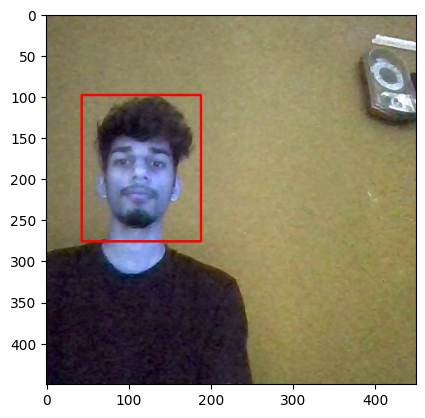

In [46]:
cv2.rectangle(augmented['image'], 
              tuple(np.multiply(augmented['bboxes'][0][:2], [450,450]).astype(int)),
              tuple(np.multiply(augmented['bboxes'][0][2:], [450,450]).astype(int)), 
                    (255,0,0), 2)

plt.imshow(augmented['image'])

In [47]:


for partition in ['train', 'test', 'val']: 
    image_dir = os.path.join('data', partition, 'images')
    label_dir = os.path.join('data', partition, 'labels')
    aug_image_dir = os.path.join('aug_data', partition, 'images')
    aug_label_dir = os.path.join('aug_data', partition, 'labels')

    os.makedirs(aug_image_dir, exist_ok=True)
    os.makedirs(aug_label_dir, exist_ok=True)

    for image in os.listdir(image_dir):
        if not image.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue  # Skip non-image files

        img_path = os.path.join(image_dir, image)
        img = cv2.imread(img_path)

        if img is None:
            print(f"⚠️ Skipping unreadable image: {img_path}")
            continue

        coords = [0, 0, 0.00001, 0.00001]  # fallback box
        label_path = os.path.join(label_dir, f'{image.split(".")[0]}.json')

        if os.path.exists(label_path):
            try:
                with open(label_path, 'r') as f:
                    label = json.load(f)
                shapes = label.get('shapes', [])
                if shapes and len(shapes[0].get('points', [])) >= 2:
                    coords[0] = shapes[0]['points'][0][0]
                    coords[1] = shapes[0]['points'][0][1]
                    coords[2] = shapes[0]['points'][1][0]
                    coords[3] = shapes[0]['points'][1][1]
                    coords = list(np.divide(coords, [640, 480, 640, 480]))
                else:
                    print(f"⚠️ Invalid or missing points in: {label_path}")
            except Exception as e:
                print(f"⚠️ Error reading label file {label_path}: {e}")

        try:
            for x in range(60):
                augmented = augmentor(image=img, bboxes=[coords], class_labels=['face'])

                # Save augmented image
                aug_img_name = f'{image.split(".")[0]}.{x}.jpg'
                aug_img_path = os.path.join(aug_image_dir, aug_img_name)
                cv2.imwrite(aug_img_path, augmented['image'])

                # Create annotation
                annotation = {
                    'image': image,
                    'bbox': [0, 0, 0, 0],
                    'class': 0
                }

                if os.path.exists(label_path) and len(augmented['bboxes']) > 0:
                    annotation['bbox'] = augmented['bboxes'][0]
                    annotation['class'] = 1

                # Save augmented label
                aug_label_name = f'{image.split(".")[0]}.{x}.json'
                aug_label_path = os.path.join(aug_label_dir, aug_label_name)
                with open(aug_label_path, 'w') as f:
                    json.dump(annotation, f)

        except Exception as e:
            print(f"❌ Error processing image {image}: {e}")


In [48]:
train_images = tf.data.Dataset.list_files('aug_data\\train\\images\\*.jpg', shuffle=False)
train_images = train_images.map(load_image)
train_images = train_images.map(lambda x: tf.image.resize(x, (120,120)))
train_images = train_images.map(lambda x: x/255)

In [49]:
test_images = tf.data.Dataset.list_files('aug_data\\test\\images\\*.jpg', shuffle=False)
test_images = test_images.map(load_image)
test_images = test_images.map(lambda x: tf.image.resize(x, (120,120)))
test_images = test_images.map(lambda x: x/255)

In [50]:
val_images = tf.data.Dataset.list_files('aug_data\\val\\images\\*.jpg', shuffle=False)
val_images = val_images.map(load_image)
val_images = val_images.map(lambda x: tf.image.resize(x, (120,120)))
val_images = val_images.map(lambda x: x/255)

In [51]:
train_images.as_numpy_iterator().next()

array([[[0.722549  , 0.6745098 , 0.6460784 ],
        [0.7207108 , 0.6635417 , 0.64295346],
        [0.7110907 , 0.6449142 , 0.6277574 ],
        ...,
        [0.49479166, 0.5352941 , 0.5416667 ],
        [0.49595588, 0.51354164, 0.47745097],
        [0.499326  , 0.49142158, 0.46599266]],

       [[0.69442403, 0.66697305, 0.6365809 ],
        [0.70012254, 0.6658088 , 0.63884807],
        [0.70012254, 0.67267156, 0.64957106],
        ...,
        [0.49270833, 0.54509807, 0.5658701 ],
        [0.47892156, 0.52254903, 0.5009804 ],
        [0.47708333, 0.490625  , 0.46905637]],

       [[0.69577205, 0.6683211 , 0.64479166],
        [0.690625  , 0.66317403, 0.6396446 ],
        [0.6929534 , 0.67334557, 0.64981616],
        ...,
        [0.4971201 , 0.5636642 , 0.5949755 ],
        [0.48137254, 0.5221201 , 0.5313113 ],
        [0.48964462, 0.50300246, 0.48455882]],

       ...,

       [[0.1697304 , 0.38541666, 0.4050245 ],
        [0.16354166, 0.37824756, 0.3983456 ],
        [0.20196079, 0

In [52]:
def load_labels(label_path):
    with open(label_path.numpy(), 'r', encoding = "utf-8") as f:
        label = json.load(f)
        
    return [label['class']], label['bbox']

In [53]:
train_labels = tf.data.Dataset.list_files('aug_data\\train\\labels\\*.json', shuffle=False)
train_labels = train_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))

In [54]:
test_labels = tf.data.Dataset.list_files('aug_data\\test\\labels\\*.json', shuffle=False)
test_labels = test_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))

In [55]:
val_labels = tf.data.Dataset.list_files('aug_data\\val\\labels\\*.json', shuffle=False)
val_labels = val_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.uint8, tf.float16]))

In [56]:
train_labels.as_numpy_iterator().next()

(array([1], dtype=uint8),
 array([0.719 , 0.3052, 1.    , 0.751 ], dtype=float16))

In [57]:
len(train_images), len(train_labels), len(test_images), len(test_labels), len(val_images), len(val_labels)

(3660, 3660, 1020, 1020, 960, 960)

In [58]:
train = tf.data.Dataset.zip((train_images, train_labels))
train = train.shuffle(5500)
train = train.batch(8)
train = train.prefetch(4)

In [59]:
test = tf.data.Dataset.zip((test_images, test_labels))
test = test.shuffle(1500)
test = test.batch(8)
test = test.prefetch(4)

In [60]:
val = tf.data.Dataset.zip((val_images, val_labels))
val = val.shuffle(1200)
val = val.batch(8)
val = val.prefetch(4)

In [61]:
train.as_numpy_iterator().next()[1]

(array([[1],
        [1],
        [1],
        [0],
        [1],
        [1],
        [1],
        [1]], dtype=uint8),
 array([[0.6133 , 0.4492 , 0.947  , 0.8345 ],
        [0.3237 , 0.2267 , 0.646  , 0.624  ],
        [0.4392 , 0.332  , 0.808  , 0.7764 ],
        [0.     , 0.     , 0.     , 0.     ],
        [0.     , 0.2737 , 0.2102 , 0.745  ],
        [0.09985, 0.265  , 0.568  , 0.791  ],
        [0.2588 , 0.3599 , 0.5576 , 0.725  ],
        [0.1638 , 0.5093 , 0.4873 , 0.8193 ]], dtype=float16))

In [62]:
data_samples = train.as_numpy_iterator()

In [65]:
res = data_samples.next()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


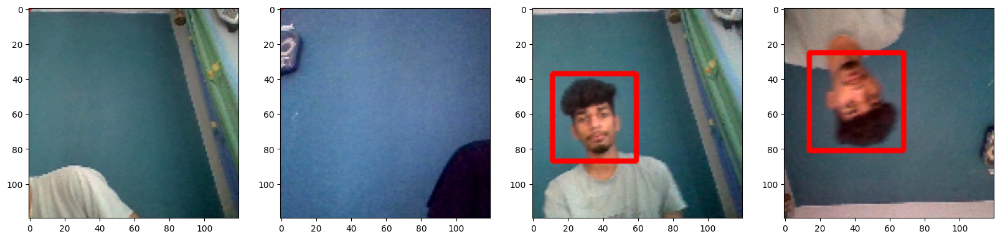

In [66]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx in range(4): 
    sample_image = res[0][idx].copy()  # Make sure it's writeable
    sample_coords = res[1][1][idx]     # Normalized bbox

    cv2.rectangle(sample_image,
                  tuple(np.multiply(sample_coords[:2], [120, 120]).astype(int)),
                  tuple(np.multiply(sample_coords[2:], [120, 120]).astype(int)),
                        (255, 0, 0), 2)

    ax[idx].imshow(sample_image)

In [67]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Dense, GlobalMaxPooling2D
from tensorflow.keras.applications import VGG16

In [68]:
vgg = VGG16(include_top=False)

In [69]:
vgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [70]:
def build_model(): 
    input_layer = Input(shape=(120,120,3))
    
    vgg = VGG16(include_top=False)(input_layer)
  
    f1 = GlobalMaxPooling2D()(vgg)
    class1 = Dense(2048, activation='relu')(f1)
    class2 = Dense(1, activation='sigmoid')(class1)

    f2 = GlobalMaxPooling2D()(vgg)
    regress1 = Dense(2048, activation='relu')(f2)
    regress2 = Dense(4, activation='sigmoid')(regress1)
    
    facetracker = Model(inputs=input_layer, outputs=[class2, regress2])
    return facetracker

In [71]:
facetracker = build_model()

In [72]:
facetracker.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 120, 120, 3  0           []                               
                                )]                                                                
                                                                                                  
 vgg16 (Functional)             (None, None, None,   14714688    ['input_2[0][0]']                
                                512)                                                              
                                                                                                  
 global_max_pooling2d (GlobalMa  (None, 512)         0           ['vgg16[0][0]']                  
 xPooling2D)                                                                                  

In [73]:
X, y = train.as_numpy_iterator().next()

In [74]:
X.shape

(8, 120, 120, 3)

In [75]:
y

(array([[1],
        [0],
        [1],
        [1],
        [1],
        [1],
        [1],
        [0]], dtype=uint8),
 array([[0.08826, 0.319  , 0.424  , 0.771  ],
        [0.     , 0.     , 0.     , 0.     ],
        [0.1537 , 0.2927 , 0.6724 , 0.9263 ],
        [0.7856 , 0.262  , 1.     , 0.8125 ],
        [0.4045 , 0.286  , 0.8887 , 0.8984 ],
        [0.4412 , 0.2925 , 0.7397 , 0.658  ],
        [0.5015 , 0.3838 , 0.8696 , 0.79   ],
        [0.     , 0.     , 0.     , 0.     ]], dtype=float16))

In [76]:
classes, coords = facetracker.predict(X)

1/1 [==============================] - 9s 9s/step


In [77]:
classes, coords

(array([[0.38806063],
        [0.4709818 ],
        [0.432937  ],
        [0.42142254],
        [0.49323794],
        [0.4034507 ],
        [0.44101912],
        [0.45851025]], dtype=float32),
 array([[0.5297935 , 0.70511055, 0.755711  , 0.64246243],
        [0.49939954, 0.49430016, 0.6910451 , 0.5984987 ],
        [0.50581497, 0.6509914 , 0.82922095, 0.5510122 ],
        [0.47503784, 0.55003375, 0.76057136, 0.5994144 ],
        [0.44799864, 0.4635673 , 0.72714776, 0.6886449 ],
        [0.5167376 , 0.69141334, 0.7326842 , 0.5881937 ],
        [0.5858386 , 0.5930959 , 0.786616  , 0.6057956 ],
        [0.50246376, 0.5370539 , 0.7561776 , 0.66738147]], dtype=float32))

In [78]:
batches_per_epoch = len(train)
lr_decay = (1./0.75 -1)/batches_per_epoch

In [79]:
opt = tf.keras.optimizers.Adam(learning_rate=0.0001, decay=lr_decay)

In [80]:
def localization_loss(y_true, yhat):            
    delta_coord = tf.reduce_sum(tf.square(y_true[:,:2] - yhat[:,:2]))
                  
    h_true = y_true[:,3] - y_true[:,1] 
    w_true = y_true[:,2] - y_true[:,0] 

    h_pred = yhat[:,3] - yhat[:,1] 
    w_pred = yhat[:,2] - yhat[:,0] 
    
    delta_size = tf.reduce_sum(tf.square(w_true - w_pred) + tf.square(h_true-h_pred))
    
    return delta_coord + delta_size

In [81]:
classloss = tf.keras.losses.BinaryCrossentropy()
regressloss = localization_loss

In [82]:
localization_loss(y[1], coords)

<tf.Tensor: shape=(), dtype=float32, numpy=3.9000268>

In [83]:
classloss(y[0], classes)

<tf.Tensor: shape=(), dtype=float32, numpy=0.7913962>

In [84]:
regressloss(y[1], coords)

<tf.Tensor: shape=(), dtype=float32, numpy=3.9000268>

In [85]:
class FaceTracker(Model): 
    def __init__(self, eyetracker,  **kwargs): 
        super().__init__(**kwargs)
        self.model = eyetracker

    def compile(self, opt, classloss, localizationloss, **kwargs):
        super().compile(**kwargs)
        self.closs = classloss
        self.lloss = localizationloss
        self.opt = opt
    
    def train_step(self, batch, **kwargs): 
        
        X, y = batch
        
        with tf.GradientTape() as tape: 
            classes, coords = self.model(X, training=True)
            
            batch_classloss = self.closs(y[0], classes)
            batch_localizationloss = self.lloss(tf.cast(y[1], tf.float32), coords)
            
            total_loss = batch_localizationloss+0.5*batch_classloss
            
            grad = tape.gradient(total_loss, self.model.trainable_variables)
        
        opt.apply_gradients(zip(grad, self.model.trainable_variables))
        
        return {"total_loss":total_loss, "class_loss":batch_classloss, "regress_loss":batch_localizationloss}
    
    def test_step(self, batch, **kwargs): 
        X, y = batch
        
        classes, coords = self.model(X, training=False)
        
        batch_classloss = self.closs(y[0], classes)
        batch_localizationloss = self.lloss(tf.cast(y[1], tf.float32), coords)
        total_loss = batch_localizationloss+0.5*batch_classloss
        
        return {"total_loss":total_loss, "class_loss":batch_classloss, "regress_loss":batch_localizationloss}

    def call(self, X, **kwargs): 
        return self.model(X, **kwargs)
    

In [86]:
model = FaceTracker(facetracker)

In [87]:
model.compile(opt, classloss, regressloss)

In [88]:
logdir='logs'

In [89]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [90]:
hist = model.fit(train, epochs=10, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/10
458/458 [==============================] - 57s 98ms/step - total_loss: 0.4659 - class_loss: 0.1409 - regress_loss: 0.3954 - val_total_loss: 0.1287 - val_class_loss: 0.0088 - val_regress_loss: 0.1243
Epoch 2/10
458/458 [==============================] - 40s 79ms/step - total_loss: 0.1698 - class_loss: 0.0531 - regress_loss: 0.1433 - val_total_loss: 0.3118 - val_class_loss: 0.1254 - val_regress_loss: 0.2491
Epoch 3/10
458/458 [==============================] - 41s 80ms/step - total_loss: 0.1291 - class_loss: 0.0392 - regress_loss: 0.1095 - val_total_loss: 0.0301 - val_class_loss: 9.8761e-05 - val_regress_loss: 0.0301
Epoch 4/10
458/458 [==============================] - 63s 124ms/step - total_loss: 0.1016 - class_loss: 0.0307 - regress_loss: 0.0862 - val_total_loss: 0.0387 - val_class_loss: 0.0045 - val_regress_loss: 0.0365
Epoch 5/10
458/458 [==============================] - 64s 121ms/step - total_loss: 0.0731 - class_loss: 0.0211 - regress_loss: 0.0625 - val_total_loss: 0.0

In [91]:
hist.history

{'total_loss': [0.01377223338931799,
  0.03004641830921173,
  0.008742435835301876,
  0.02212979644536972,
  0.008213152177631855,
  0.009783530607819557,
  0.0052513135597109795,
  0.00626587588340044,
  0.0025996160693466663,
  0.002797728171572089],
 'class_loss': [0.0015075706178322434,
  0.02166079357266426,
  0.0002434755297144875,
  0.013933158479630947,
  0.0004153543268330395,
  0.0004427101230248809,
  0.0020395666360855103,
  0.0013509648852050304,
  9.717846114654094e-05,
  5.2739324019057676e-05],
 'regress_loss': [0.013018447905778885,
  0.0192160215228796,
  0.008620698004961014,
  0.01516321673989296,
  0.0080054746940732,
  0.0095621757209301,
  0.004231530241668224,
  0.005590393207967281,
  0.002551026875153184,
  0.002771358471363783],
 'val_total_loss': [0.12869776785373688,
  0.31184670329093933,
  0.030144186690449715,
  0.03872445225715637,
  0.06004398316144943,
  0.041787613183259964,
  0.06694039702415466,
  0.7755132913589478,
  0.028537428006529808,
  0.490

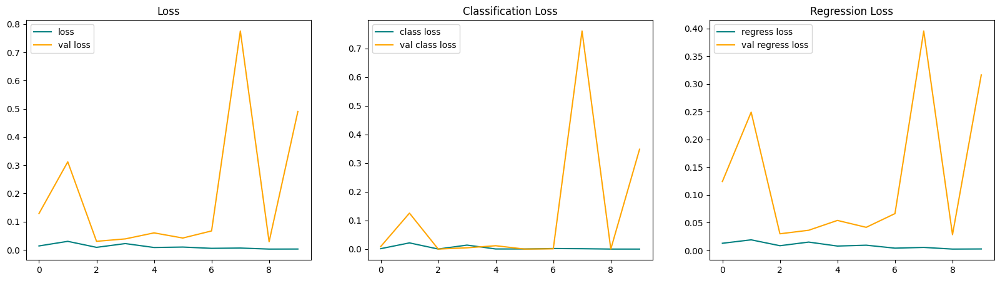

In [92]:
fig, ax = plt.subplots(ncols=3, figsize=(20,5))

ax[0].plot(hist.history['total_loss'], color='teal', label='loss')
ax[0].plot(hist.history['val_total_loss'], color='orange', label='val loss')
ax[0].title.set_text('Loss')
ax[0].legend()

ax[1].plot(hist.history['class_loss'], color='teal', label='class loss')
ax[1].plot(hist.history['val_class_loss'], color='orange', label='val class loss')
ax[1].title.set_text('Classification Loss')
ax[1].legend()

ax[2].plot(hist.history['regress_loss'], color='teal', label='regress loss')
ax[2].plot(hist.history['val_regress_loss'], color='orange', label='val regress loss')
ax[2].title.set_text('Regression Loss')
ax[2].legend()

plt.show()

In [93]:
test_data = test.as_numpy_iterator()

In [94]:
test_sample = test_data.next()

In [95]:
yhat = facetracker.predict(test_sample[0])

1/1 [==============================] - 0s 44ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


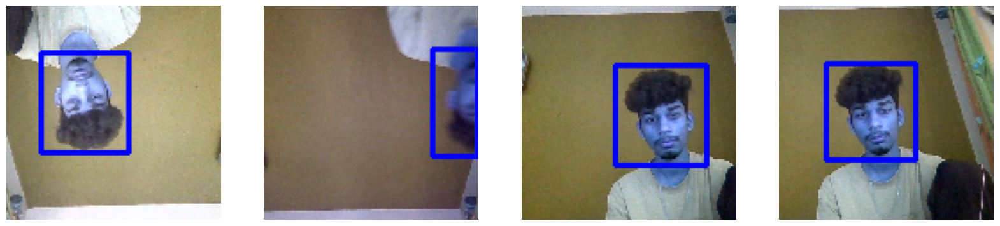

In [97]:
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))

for idx in range(4):
    # Make a writeable copy to avoid OpenCV error
    sample_image = test_sample[0][idx].numpy().copy() if hasattr(test_sample[0][idx], 'numpy') else test_sample[0][idx].copy()
    sample_coords = yhat[1][idx]
    class_confidence = yhat[0][idx]

    # Optional: convert confidence tensor to float
    if hasattr(class_confidence, 'numpy'):
        class_confidence = class_confidence.numpy()

    # Draw box only if confidence is high
    if class_confidence > 0.9:
        start_point = tuple(np.multiply(sample_coords[:2], [120, 120]).astype(int))
        end_point = tuple(np.multiply(sample_coords[2:], [120, 120]).astype(int))
        cv2.rectangle(sample_image, start_point, end_point, (255, 0, 0), 2)

    # OpenCV uses BGR; matplotlib expects RGB
    ax[idx].imshow(cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB))
    ax[idx].axis("off")


In [98]:
from tensorflow.keras.models import load_model

In [ ]:
facetracker.save('facetracker.h5')

In [100]:
facetracker = load_model('facetracker.h5')

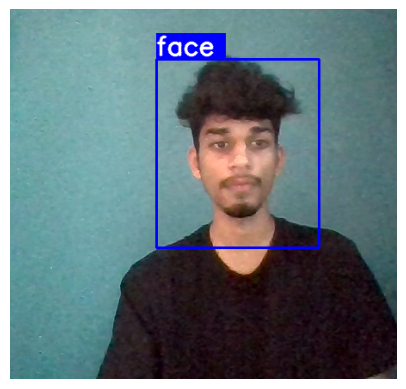

1/1 [==============================] - 0s 31ms/step


In [ ]:
from IPython.display import clear_output

cap = cv2.VideoCapture(0)

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = frame[50:500, 50:500, :]
    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    resized = tf.image.resize(rgb, (120, 120))
    
    yhat = facetracker.predict(np.expand_dims(resized / 255, 0))
    sample_coords = yhat[1][0]

    if yhat[0] > 0.5:
        start_point = tuple(np.multiply(sample_coords[:2], [450, 450]).astype(int))
        end_point = tuple(np.multiply(sample_coords[2:], [450, 450]).astype(int))
        cv2.rectangle(frame, start_point, end_point, (255, 0, 0), 2)

        label_rect_start = tuple(np.add(start_point, [0, -30]))
        label_rect_end = tuple(np.add(start_point, [80, 0]))
        cv2.rectangle(frame, label_rect_start, label_rect_end, (255, 0, 0), -1)

        cv2.putText(frame, 'face', tuple(np.add(start_point, [0, -5])),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

    # Display using matplotlib
    clear_output(wait=True)
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

    # Break manually (since there's no waitKey)
    import time
    time.sleep(0.1)

cap.release()
